<a href="https://colab.research.google.com/github/lisni946/Word2Vec_hellenistic_greek/blob/master/T_SNE_Representation_and_Cosine_Similarity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Word2Vec Visualisations

*Dependencies*

In [0]:
#import tensorflow_core
import sklearn.manifold
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [0]:
from __future__ import absolute_import, division, print_function
import codecs
import glob
import multiprocessing
import os
import pprint
import re
import gensim.models.word2vec as w2v
import numpy as np
import string

## Train t-SNE

In [0]:
greek2vec = w2v.Word2Vec.load(os.path.join("trained", "greek2vec.w2v"))

In [0]:
tsne = sklearn.manifold.TSNE(n_components=2, random_state=0)

In [0]:
all_word_vectors_matrix = greek2vec.wv.syn0

/Users/christinaoaks/venv/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `syn0` (Attribute will be removed in 4.0.0, use self.vectors instead).
  """Entry point for launching an IPython kernel.


In [0]:
%%time
#train t sne
all_word_vectors_matrix_2d = tsne.fit_transform(all_word_vectors_matrix)

CPU times: user 46min 10s, sys: 58.4 s, total: 47min 9s
Wall time: 22min 54s


In [0]:
#save model ##doesn't work
if not os.path.exists("2dvectors"):
    os.makedirs("2dvectors")


all_word_vectors_matrix_2d.write(os.path.join("2dvectors", "all_word_vectors_matrix_2d"))

all_word_vectors_matrix_2 = open((os.path.join("2dvectors", "all_word_vectors_matrix_2d")), 'r')

####

<_io.TextIOWrapper name='2dvectors/all_word_vectors_matrix_2d' mode='r' encoding='UTF-8'>


In [0]:
#plot point in 2d space
points = pd.DataFrame(
    [
        (word, coords[0], coords[1])
        for word, coords in [
            (word, all_word_vectors_matrix_2d[greek2vec.wv.vocab[word].index])
            for word in greek2vec.wv.vocab
        ]
    ],
    columns=["word", "x", "y"]
)

## Functions

### *All Unique Tokens in Corpus*

In [154]:
#display are words in DataFrame in alphabetical order
pd.set_option('display.max_rows', None)
points.sort_values(by=['word'], inplace=True)
points.head(36362)

,word,x,y
18201,(,1.020888,-5.038178
28993,),6.117567,-20.636534
10345,*,4.066002,-5.080960
17624,**,4.634398,9.631356
35916,/,-5.986745,-5.647650
31100,Α,-25.339882,-10.372503
23138,ΑΛΕΞΑΝΔΡΟΣ,15.277430,7.951734
31703,ΑΠΟ,-1.558871,-3.736595
34563,Ααρων,-1.445561,-0.750359
35729,Αβαδων,-19.679506,-12.301001


In [0]:
#write DataFrame to CSV file ## current issue: words illegable, need to export in unicode
points.to_csv(r'/Users/christinaoaks/Desktop/words.csv', index=False, header=True)

#### Search for Token location

In [172]:
# search DataFrame table for specific words

search_list = ["πατήρ", "θυγάτηρ", "ἀδελφή", "ἀδελφός", "τέκνον"]

points['word'] = points.word.str.extract('({0})'.format('|'.join(search_list)), flags=re.IGNORECASE)
result = points[~pd.isna(points.word)]

print(result)

        word         x         y
378  θυγάτηρ -4.518351 -5.235757
8      πατήρ -3.762031 -5.404225
998   τέκνον -4.155520 -4.855129
312   ἀδελφή -4.075126 -6.217377
300  ἀδελφός -3.718601 -6.226536


### *t-SNE Visualisations*

Text(0.5, 1.0, 'T-SNE Representation of Word Vectors for Hellenistic Greek')

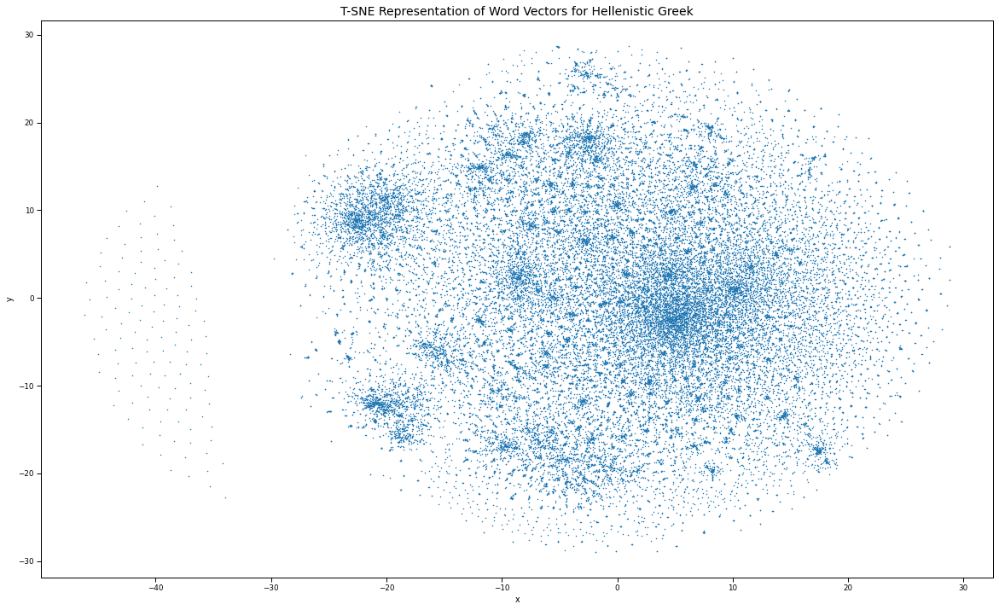

In [0]:
#plot
sns.set_context("paper")
points.plot.scatter("x", "y", s=0.5, figsize=(20, 12))
plt.title("T-SNE Representation of Word Vectors for Hellenistic Greek", fontsize=14)

In [0]:
# this code zooms in to a part of the scatter plot

def plot_region(x_bounds, y_bounds):
    slice = points[
        (x_bounds[0] <= points.x) &
        (points.x <= x_bounds[1]) & 
        (y_bounds[0] <= points.y) &
        (points.y <= y_bounds[1])
    ]
    
    ax = slice.plot.scatter("x", "y", s=30, figsize=(10, 8))
    for i, point in slice.iterrows():
        ax.text(point.x + 0.005, point.y + 0.005, point.word, fontsize=11)

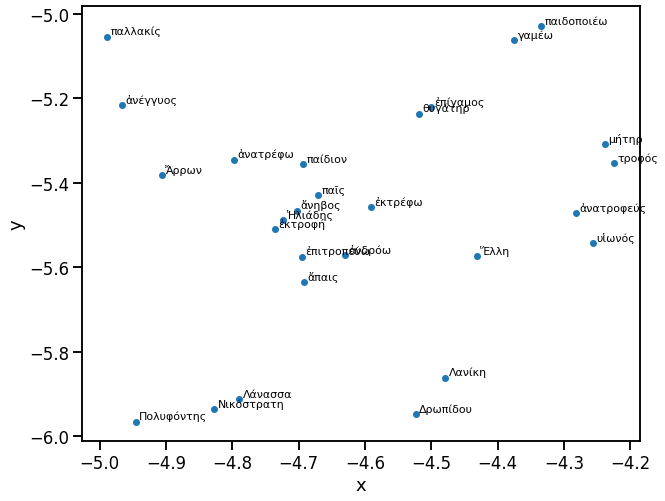

In [0]:
# example coordinates for a particular region, the two numbers in the x_bounds and y_bounds are the parameters
plot_region(x_bounds=(-5, -4), y_bounds=(-6, -5))

### *Cosine Similarity*

In [0]:
# example function, computes the cosine similarity of the vectors
greek2vec.wv.most_similar(u"πόλις")

[('κώμη', 0.48956602811813354),
 ('χώρα', 0.46132469177246094),
 ('ὀχυρός', 0.4532320499420166),
 ('τεῖχος', 0.4469856023788452),
 ('κατασκάπτω', 0.4453783631324768),
 ('Κοτύωρα', 0.4453757107257843),
 ('φρούριον', 0.4445106089115143),
 ('οἰκήτωρ', 0.4369056820869446),
 ('Μάρισαν', 0.43522655963897705),
 ('Ὀυόλσκων', 0.43489837646484375)]

In [0]:
greek2vec.wv.most_similar(u"μήτηρ")

[('πατήρ', 0.5514865517616272),
 ('θυγάτηρ', 0.47137677669525146),
 ('Αμιταλ', 0.4540150463581085),
 ('ἀδελφή', 0.4215865433216095),
 ('ἀδελφός', 0.4085274934768677),
 ('Γαζουβα', 0.4082378149032593),
 ('τέκνον', 0.40611618757247925),
 ('γυνή', 0.40582388639450073),
 ('τροφός', 0.4038838744163513),
 ('Βερσάβην', 0.3965262174606323)]

In [0]:
# example function, computes the cosine similarity of the vectors
greek2vec.wv.most_similar(positive=[u"βασιλεύς"], negative=[u'ἀνήρ'], topn=1)

[('βασιλεία', 0.3673717975616455)]

###*Semantic Clusters*

/Users/christinaoaks/venv/lib/python3.7/site-packages/ipykernel_launcher.py:21: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).


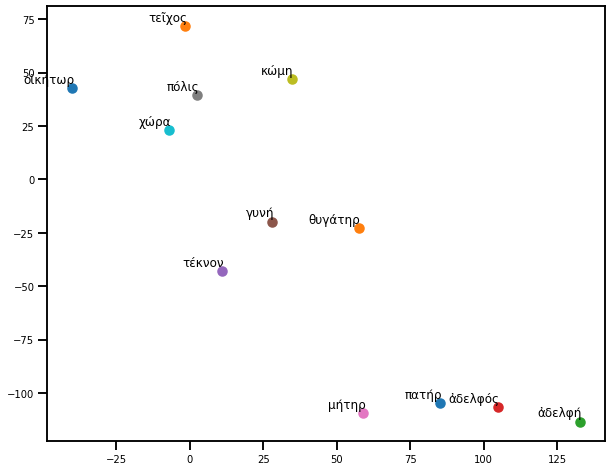

In [0]:
## Plot individual lexemes on a graph
##from https://github.com/Suji04/NormalizedNerd/blob/master/Introduction%20to%20NLP/Word2Vec.ipynb
from sklearn.manifold import TSNE
import matplotlib
vocab = ["πατήρ",
         "θυγάτηρ",
         "ἀδελφή",
         "ἀδελφός",
         "τέκνον",
         "γυνή",
         "μήτηρ",
         "πόλις",
         "κώμη",
         'χώρα',
         'οἰκήτωρ',
         'τεῖχος']

def tsne_plot(model):
    labels = []
    wordvecs = []

    for word in vocab:
        wordvecs.append(model[word])
        labels.append(word)
    
    tsne_model = TSNE(perplexity=2, n_components=2, init='pca', random_state=42)
    coordinates = tsne_model.fit_transform(wordvecs)

    x = []
    y = []
    for value in coordinates:
        x.append(value[0])
        y.append(value[1])
        
    plt.figure(figsize=(10,8))
    matplotlib.rc('xtick', labelsize=10) 
    matplotlib.rc('ytick', labelsize=10) 
    plt.rcParams.update({'font.size': 12}) 
    for i in range(len(x)):
        plt.scatter(x[i],y[i])
        plt.annotate(labels[i],
                     xy=(x[i], y[i]),
                     xytext=(2, 2),
                     textcoords='offset points',
                     ha='right',
                     va='bottom')
    plt.show()

tsne_plot(greek2vec)

### *Closest Words Scatterplot*

In [0]:
# Display Closest Words to another word in a Scatterplot
# adapted from https://medium.com/@aneesha/using-tsne-to-plot-a-subset-of-similar-words-from-word2vec-bb8eeaea6229
 
from sklearn.manifold import TSNE
def display_closestwords_tsnescatterplot(greek2vec, word):
    
    arr = np.empty((0,300), dtype='f')
    word_labels = [word]

    # get close words
    close_words = greek2vec.wv.similar_by_word(word)
    
    # add the vector for each of the closest words to the array
    arr = np.append(arr, np.array([greek2vec[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = greek2vec[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    # find tsne coords for 2 dimensions
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    # display scatter plot

    

    plt.figure(figsize=(10,8))
    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.rcParams.update({'font.size': 12})
        plt.scatter(x_coords, y_coords)
        plt.annotate(label, xy=(x, y), xytext=(2, 5), textcoords='offset points')
        plt.title("Closest Words to "+var,fontsize=14)
    plt.xlim(x_coords.min()+100, x_coords.max()+100)
    plt.ylim(y_coords.min()+100, y_coords.max()+100)
    plt.show()

/Users/christinaoaks/venv/lib/python3.7/site-packages/ipykernel_launcher.py:11: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  # This is added back by InteractiveShellApp.init_path()
/Users/christinaoaks/venv/lib/python3.7/site-packages/ipykernel_launcher.py:13: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  del sys.path[0]


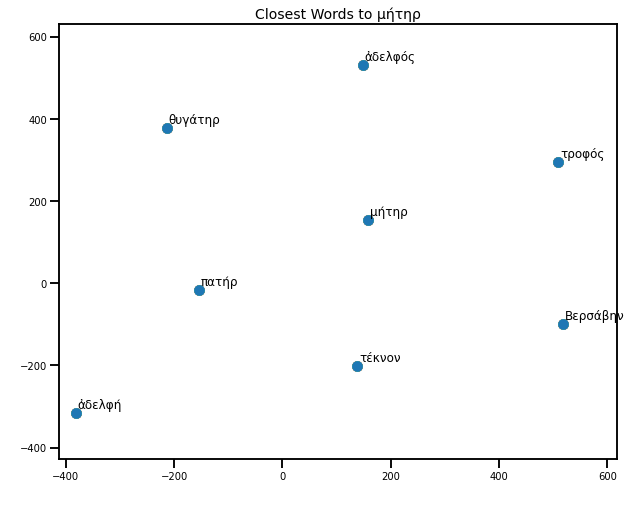

In [0]:
var = u'μήτηρ'
display_closestwords_tsnescatterplot(greek2vec, var)